In [1]:
import asdf
import astropy.units as u
import fiasco
import matplotlib.pyplot as plt
import ndcube
import numpy as np

from astropy.visualization import ImageNormalize, LogStretch
from astropy.coordinates import SkyCoord

from mocksipipeline.instrument.configuration import moxsi_cdr
from mocksipipeline.util import build_moxsi_collection
from mocksipipeline.visualization import plot_detector_image, plot_labeled_spectrum

In [2]:
def get_1d_slot_spectra(collection, orders=None, cutout=None):
    """
    Zoom into a given region and build a collection of 1D slot spectra
    """
    if cutout is None:
        cutout = np.s_[:,:,:]
    if orders is None:
        orders = np.arange(-12,13,1)
    slot_cutouts = {f'spectrogram_slot_{i}': collection[f'spectrogram_slot_{i}'][cutout] for i in orders}
    slot_cutouts['all_components'] = collection['all_components'][cutout]
    slot_cutouts_rebin = {k: v.rebin((1, v.data.shape[1], 1), operation=np.sum) for k, v in slot_cutouts.items()}
    return slot_cutouts_rebin

In [3]:
def get_line_ratio(collection, wavelength_a, wavelength_b, source_location):
    # Get line position in 1st order
    _, _, idx_a = collection['spectrogram_slot_1'].wcs.world_to_array_index(source_location, wavelength_a)
    _, _, idx_b = collection['spectrogram_slot_1'].wcs.world_to_array_index(source_location, wavelength_b)
    # Take ratio from total components
    ratio = collection['all_components'].data[0,0,idx_a] / collection['all_components'].data[0,0,idx_b]
    return ratio

In [4]:
with asdf.open('../data/line_lists/full-line-list.asdf') as af:
    full_line_list = af.tree['data']
full_line_list.sort('wavelength')
selected_ar_lines = full_line_list[[
    326,
    371,
    280,
    357,
    385,
    396,
    397,
    398,
    513,
    559,
    224,
    137,
    751,
    17,
    44,
    403,
    704,
    634,
]]

2024-10-01 10:11:01 - synthesizAR - WARNING: UnitsWarning: The unit 'Angstrom' has been deprecated in the VOUnit standard. Suggested: 0.1nm.


In [5]:
coronal_ar = build_moxsi_collection(
    '/Users/wtbarnes/Documents/codes/mocksipipeline/pipeline/results/cdr/rfa/ar_1h_coronal/detector_images/',
    all_components_sum=False
)

In [6]:
photospheric_ar = build_moxsi_collection(
    '/Users/wtbarnes/Documents/codes/mocksipipeline/pipeline/results/cdr/rfa/ar_1h_photospheric_dem_coronal/detector_images/',
    all_components_sum=False,
)

In [7]:
norm = ImageNormalize(vmin=0, vmax=5e3, stretch=LogStretch())

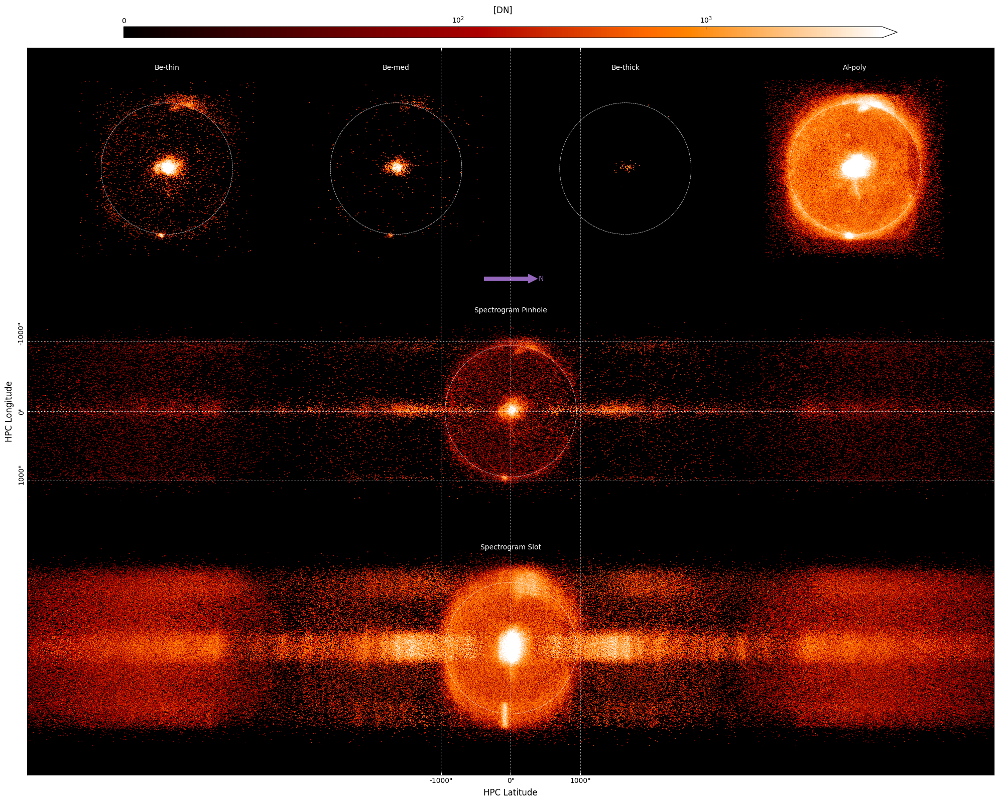

In [8]:
fig = plot_detector_image(coronal_ar, norm=norm, prime_key='all_components')

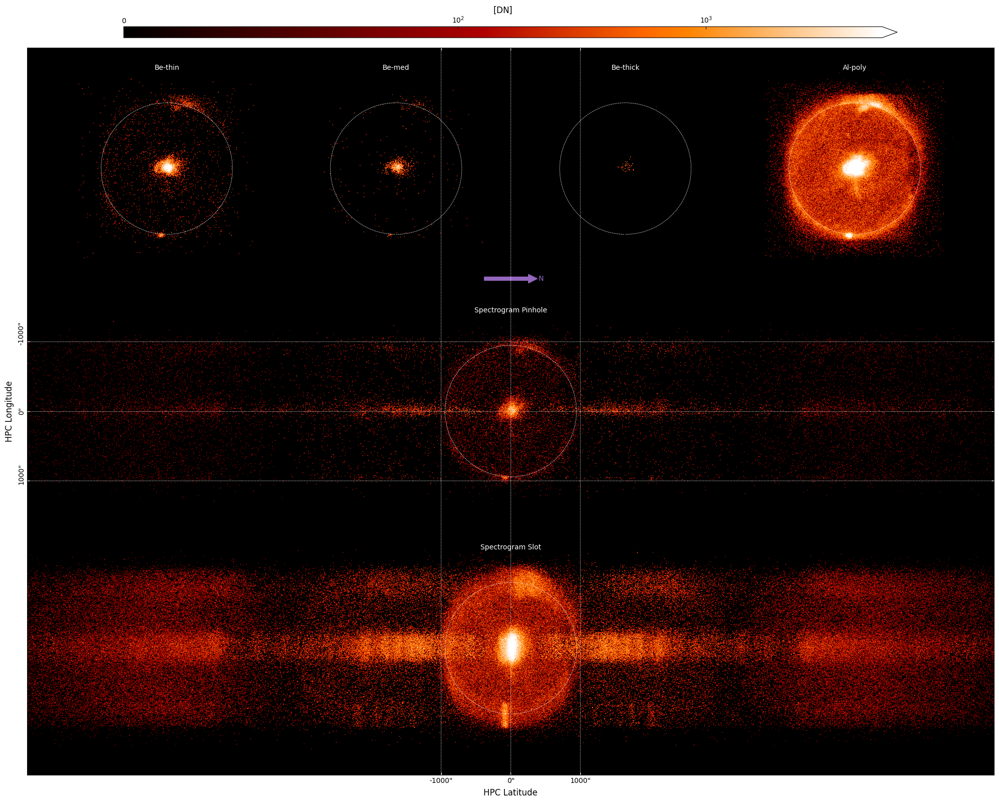

In [9]:
fig = plot_detector_image(photospheric_ar, norm=norm, prime_key='all_components')

In [10]:
coronal_slot_positive = get_1d_slot_spectra(coronal_ar, orders=range(3), cutout=np.s_[:,220:320,:])

In [11]:
photospheric_slot_positive = get_1d_slot_spectra(photospheric_ar, orders=range(3), cutout=np.s_[:,220:320,:])

In [12]:
source_location = coronal_ar['spectrogram_slot_0'][0].wcs.array_index_to_world(
    *np.unravel_index(coronal_ar['spectrogram_slot_0'][0,...].data.argmax(),
                      coronal_ar['spectrogram_slot_0'][0,...].data.shape)
)

#source_location = SkyCoord(
#    Tx=source_location.Tx,
#    Ty=source_location.Ty + 15*u.arcsec,
#    frame=source_location.frame,
#)

In [13]:
DN_threshold = 100*u.photon * moxsi_cdr['spectrogram_slot_1'].camera_gain*moxsi_cdr['spectrogram_slot_1'].electron_per_photon

/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/astropy/units/equivalencies.py:141: RuntimeWarning: divide by zero encountered in divide
  (si.m, si.J, lambda x: hc / x),


In [14]:
pix_loc,_,_ = coronal_slot_positive['spectrogram_slot_1'].wcs.world_to_pixel(
    moxsi_cdr['spectrogram_slot_1'].wavelength,
    source_location
)

2024-10-01 10:11:45 - synthesizAR - WARNING: No observer defined on WCS, SpectralCoord will be converted without any velocity frame change


2024-10-01 10:11:47 - synthesizAR - WARNING: No observer defined on WCS, SpectralCoord will be converted without any velocity frame change
2024-10-01 10:11:47 - synthesizAR - WARNING: No observer defined on WCS, SpectralCoord will be converted without any velocity frame change
2024-10-01 10:11:47 - synthesizAR - WARNING: No observer defined on WCS, SpectralCoord will be converted without any velocity frame change
/Users/wtbarnes/Documents/codes/mocksipipeline/mocksipipeline/visualization.py:137: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(y_lim)


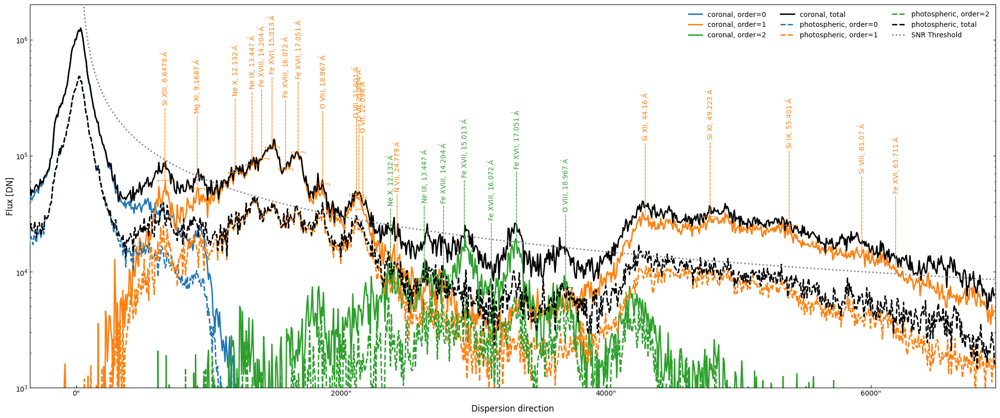

In [15]:
fig,ax = plot_labeled_spectrum(
    coronal_slot_positive, 
    figsize=(25,10),
    #y_lim=(1000,2e6),
    #x_lim=(950,2000),
    colors={**{f'spectrogram_slot_{i}': f'C{i}' for i in range(5)}, 'all_components': 'k'},
    labels={**{f'spectrogram_slot_{i}': f'coronal, order={i}' for i in range(5)}, 'all_components': 'coronal, total'},
    line_list=selected_ar_lines,
    #threshold=DN_threshold,
    source_location=source_location,
    skip_component_labels=['spectrogram_slot_0'],
    ratio_threshold=0.2,
    log_y=True,
)
fig,ax = plot_labeled_spectrum(
    photospheric_slot_positive,
    figure=fig,
    axes=ax,
    #figsize=(15,10),
    y_lim=(1000,2e6),
    x_lim=(950,2000),
    ls='--',
    colors={**{f'spectrogram_slot_{i}': f'C{i}' for i in range(5)}, 'all_components': 'k'},
    labels={**{f'spectrogram_slot_{i}': f'photospheric, order={i}' for i in range(5)}, 'all_components': 'photospheric, total'},
    #line_list=selected_ar_lines,
    #threshold=DN_threshold,
    #source_location=source_location,
    skip_component_labels=['spectrogram_slot_0'],
    #ratio_threshold=0.4,
    log_y=True,
)
ax.plot(pix_loc, DN_threshold, color='grey', ls=':', label='SNR Threshold')
ax.legend(loc=1,ncol=3)
#ax.set_title('Active Region, 1h')
#fig.savefig(figure_directory / 'moxsi_ar_1h_spectra.png')

(0.0, 5.0)

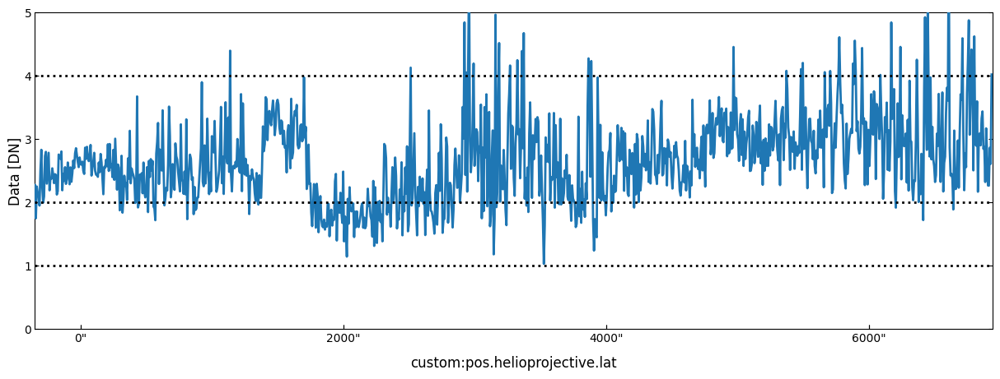

In [49]:
p_to_c_ratio = coronal_slot_positive['all_components'][0,0,:] / photospheric_slot_positive['all_components'][0,0,:].data
plt.figure(figsize=(15,5))
p_to_c_ratio.plot()
plt.axhline(y=1, ls=':', color='k')
plt.axhline(y=2, ls=':', color='k')
plt.axhline(y=4, ls=':', color='k')
plt.xlim(950,2000)
plt.ylim(0, 5)

In [63]:
selected_ar_lines

atomic number,ionization stage,transition,transition (latex),ion name,lower level,upper level,max temperature_flare_ext,wavelength,only theoretical_flare_ext,element,ion id,energy,abundance (coronal),abundance (photospheric),intensity (coronal)_flare_ext,intensity_scaled (coronal)_flare_ext,intensity (photospheric)_flare_ext,intensity_scaled (photospheric)_flare_ext,max temperature_active_region,only theoretical_active_region,intensity (coronal)_active_region,intensity_scaled (coronal)_active_region,intensity (photospheric)_active_region,intensity_scaled (photospheric)_active_region
,,,,,,,MK,Angstrom,,,,keV,,,ph / (s sr cm2),,ph / (s sr cm2),,MK,,ph / (s sr cm2),,ph / (s sr cm2),
int16,int16,str48,str93,str9,int16,int16,float32,float64,bool,str2,str5,float64,float64,float64,float64,float64,float64,float64,float32,bool,float64,float64,float64,float64
26,17,2s2.2p6 1S0 - 2s2.2p5.3d 1P1,2s$^{2}$ 2p$^{6}$ $^1$S$_{0}$ - 2s$^{2}$ 2p$^{5}$ 3d $^1$P$_{1}$,Fe XVII,1,27,7.943284034729004,15.012999534606934,False,Fe,fe_17,0.825845615643965,0.0001258925411794166,2.951209226666384e-05,3748177892554219.5,1.0,878658662067070.4,0.9012354747280512,5.01186990737915,False,2225784593858.759,1.0,521774838161.8854,0.5266273912427579
26,17,2s2.2p6 1S0 - 2s2.2p5.3s 1P1,2s$^{2}$ 2p$^{6}$ $^1$S$_{0}$ - 2s$^{2}$ 2p$^{5}$ 3s $^1$P$_{1}$,Fe XVII,1,3,7.943284034729004,17.051000595092773,False,Fe,fe_17,0.7271373767289793,0.0001258925411794166,2.951209226666384e-05,2995105376327348.5,0.7990830377280506,702121232810619.1,0.7201619808539728,5.01186990737915,False,2134327902406.0183,0.9589103583046258,500335297016.1516,0.5049884604296233
26,18,2s2.2p5 2P3/2 - 2s2.2p4(1D).3d 2D5/2,2s$^{2}$ 2p$^{5}$ $^2$P$_{3/2}$ - 2s$^{2}$ 2p$^{4}$ ($^1$D) 3d $^2$D$_{5/2}$,Fe XVIII,1,56,8.912505149841309,14.203900337219238,False,Fe,fe_18,0.872888400296064,0.0001258925411794166,2.951209226666384e-05,1835116443907553.5,0.4896022804982188,430193284727551.4,0.44124694369274864,6.309576034545898,False,208962231324.89133,0.0938825041297556,48985528398.53577,0.04944109823319064
26,18,2s2.2p5 2P3/2 - 2s2.2p4(3P).3s 4P5/2,2s$^{2}$ 2p$^{5}$ $^2$P$_{3/2}$ - 2s$^{2}$ 2p$^{4}$ ($^3$P) 3s $^4$P$_{5/2}$,Fe XVIII,1,4,8.912505149841309,16.07200050354004,False,Fe,fe_18,0.7714297819110404,0.0001258925411794166,2.951209226666384e-05,1255486084382404.0,0.33495904420023276,294314665624241.1,0.30187697321425094,6.309576034545898,False,201585572879.32556,0.09056832068814182,47256270869.64894,0.047695758453233636
8,8,1s 2S1/2 - 2p 2P3/2,1s $^2$S$_{1/2}$ - 2p $^2$P$_{3/2}$,O VIII,1,4,11.220189094543457,18.967100143432617,False,O,o_8,0.6536803069294171,0.0007762471166286928,0.0004897788193684457,1545190098544784.8,0.4122510037782132,974949041294903.1,1.0,2.8183817863464355,False,1367396974302.184,0.6143438040118606,862769163755.955,0.8707929948368375
8,7,1s2 1S0 - 1s.2p 1P1,1s$^{2}$ $^1$S$_{0}$ - 1s 2p $^1$P$_{1}$,O VII,1,7,7.079456329345703,21.601499557495117,False,O,o_7,0.573961072022804,0.0007762471166286928,0.0004897788193684457,119535470268644.78,0.031891621394518864,75421782891895.02,0.07735971799276983,2.238720655441284,False,1570289359709.8772,0.7054992491378178,990785604468.0447,1.0
8,7,1s2 1S0 - 1s.2p 3P1,1s$^{2}$ $^1$S$_{0}$ - 1s 2p $^3$P$_{1}$,O VII,1,4,2.8183817863464355,21.803600311279297,False,O,o_7,0.5686409430696706,0.0007762471166286928,0.0004897788193684457,14228124883848.127,0.003796011099716583,8977339893645.35,0.009208009355772965,1.9952632188796997,False,275240968010.3163,0.12366019998958722,173665310267.94656,0.17528041332533079
8,7,1s2 1S0 - 1s.2s 3S1,1s$^{2}$ $^1$S$_{0}$ - 1s 2s $^3$S$_{1}$,O VII,1,2,2.8183817863464355,22.097700119018555,False,O,o_7,0.5610728617250639,0.0007762471166286928,0.0004897788193684457,60396034780597.14,0.016113438719270574,38107321722298.87,0.03908647540356126,1.9952632188796997,False,1136431692830.5374,0.5105757744779554,717039923091.4847,0.7237084590833002


In [53]:
coronal_ne_fe = get_line_ratio(coronal_slot_positive, 12.1321*u.AA, 15.0129*u.AA, source_location)
photospheric_ne_fe = get_line_ratio(photospheric_slot_positive, 12.1321*u.AA, 15.0129*u.AA, source_location)

2024-08-07 17:41:08 - synthesizAR - WARNING: No observer defined on WCS, SpectralCoord will be converted without any velocity frame change


In [54]:
photospheric_ne_fe / coronal_ne_fe

1.0956586676458158

In [55]:
coronal_o_si = get_line_ratio(coronal_slot_positive, 18.967100143432617	*u.AA, 44.160301208496094*u.AA, source_location)
photospheric_o_si = get_line_ratio(photospheric_slot_positive, 18.967100143432617*u.AA, 44.160301208496094*u.AA, source_location)

In [56]:
photospheric_o_si / coronal_o_si

1.7615161716536536

## Component-wise Spectra

In [16]:
component_collections = {}
for ab_model in ['coronal', 'photospheric']:
    for el in ['fe','si','ne','o']:
        component_collections[f'{ab_model}_{el}'] = build_moxsi_collection(
            f'/Users/wtbarnes/Documents/codes/mocksipipeline/pipeline/results/cdr/rfa/ar_1h_{ab_model}_{el}/detector_images/',
            all_components_sum=False
        )

In [17]:
norm = ImageNormalize(vmin=0, vmax=5e3, stretch=LogStretch())

coronal_fe
coronal_si
coronal_ne
coronal_o
photospheric_fe
photospheric_si
photospheric_ne
photospheric_o


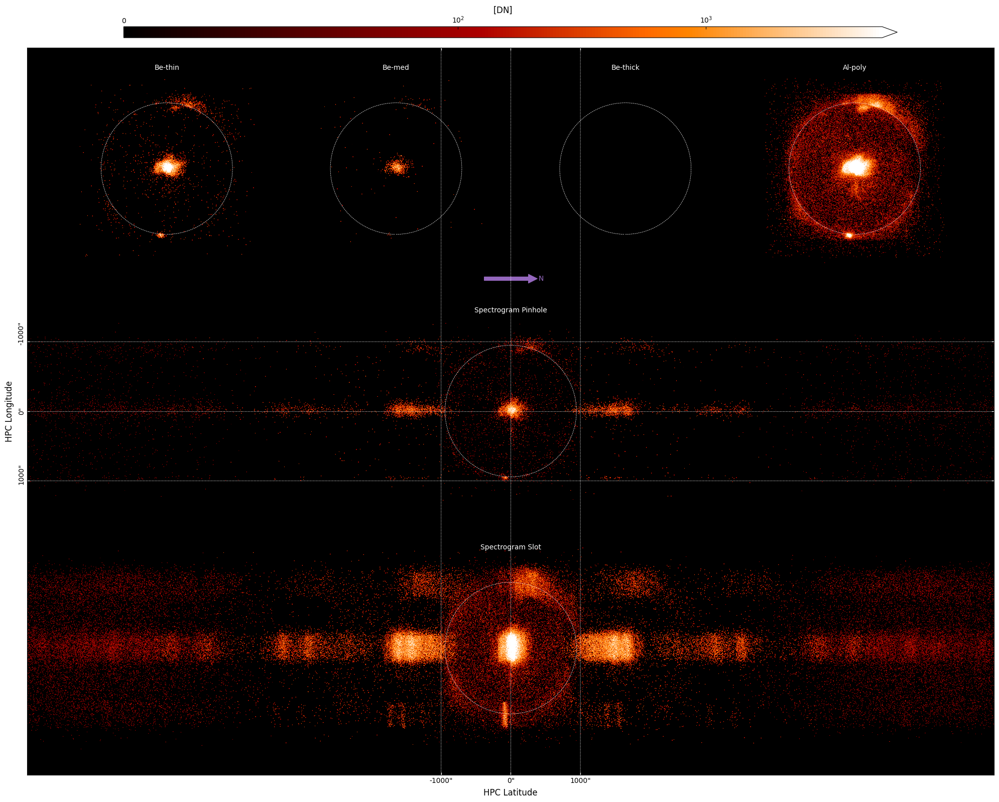

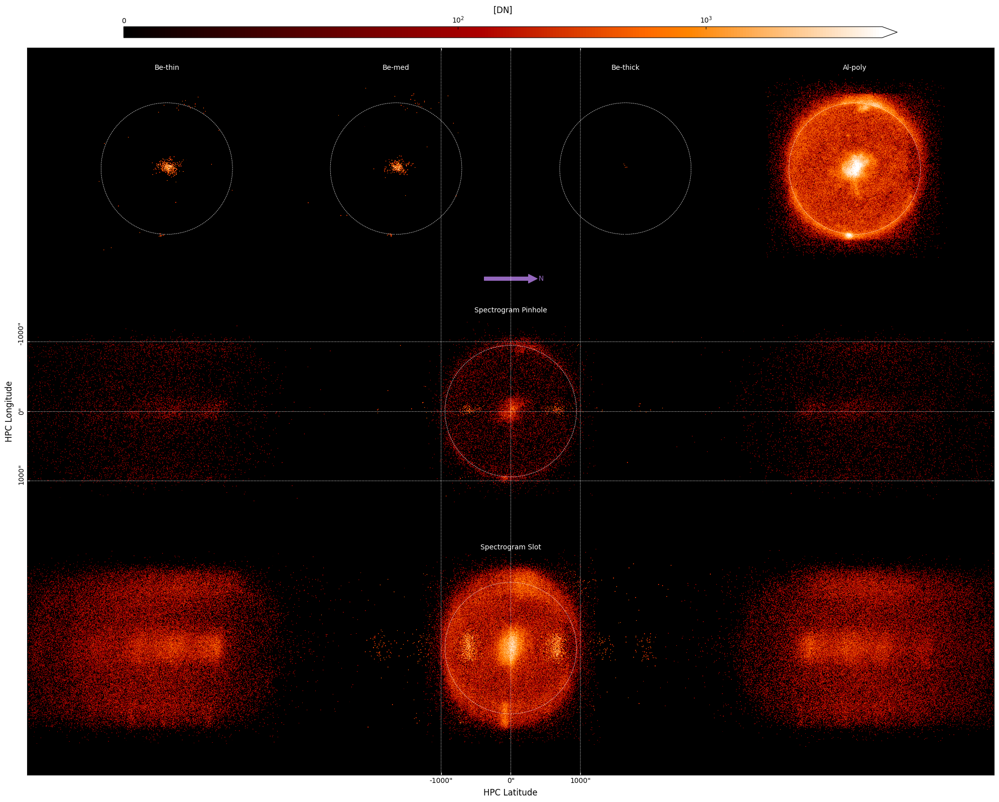

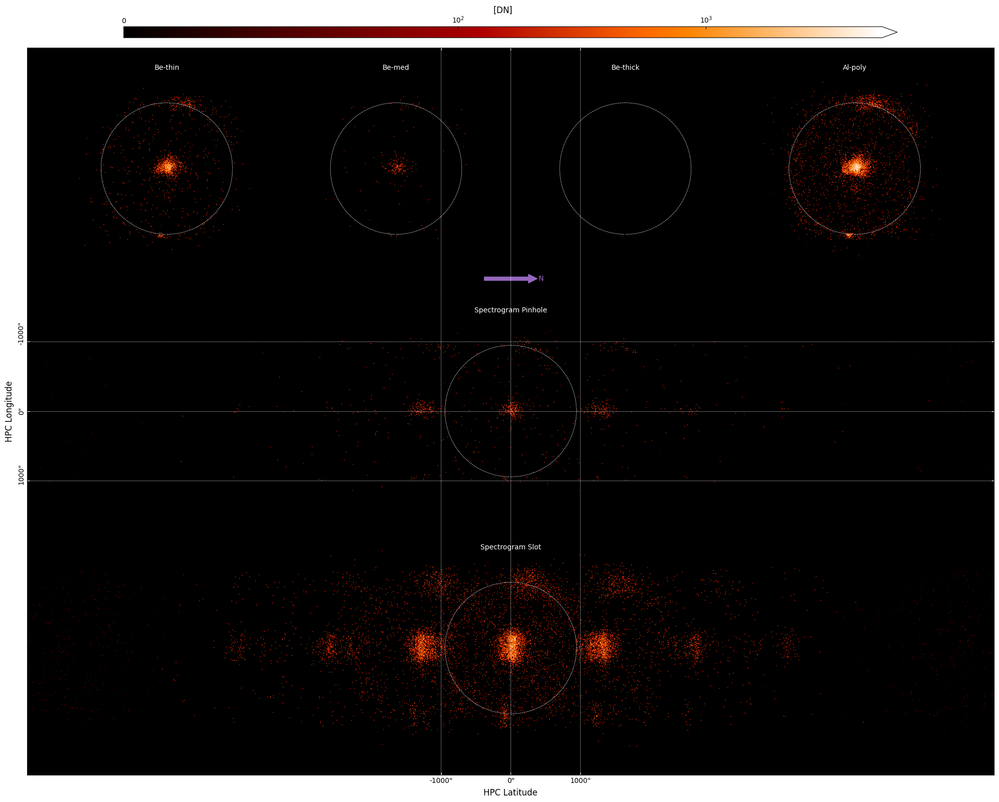

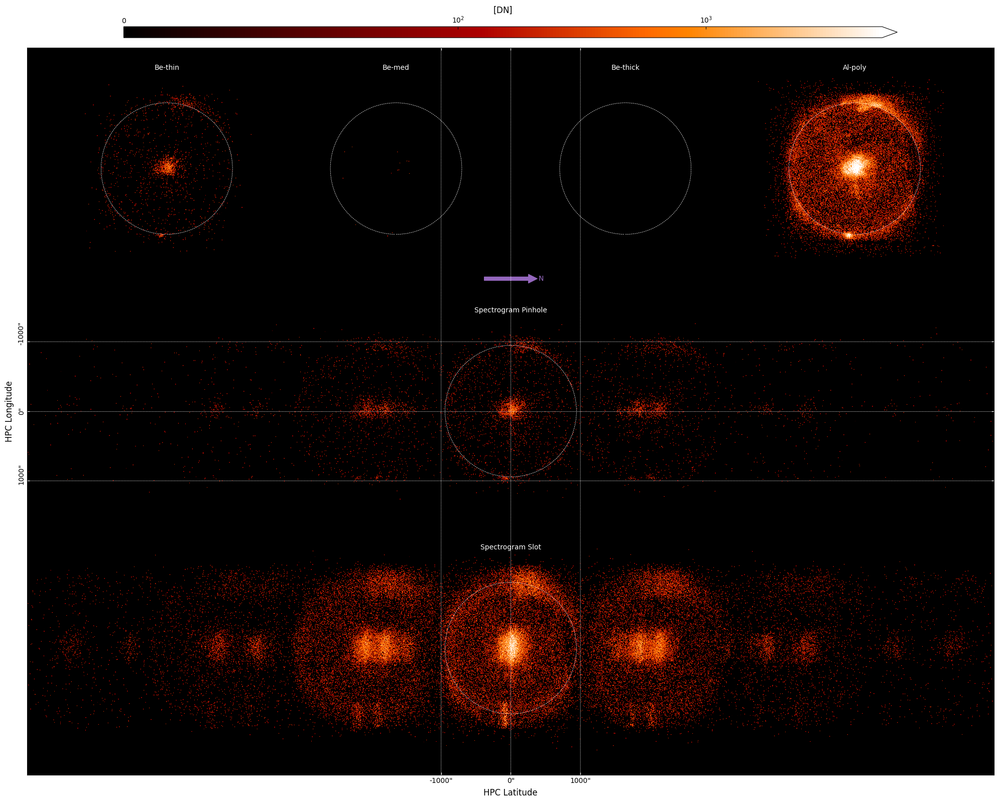

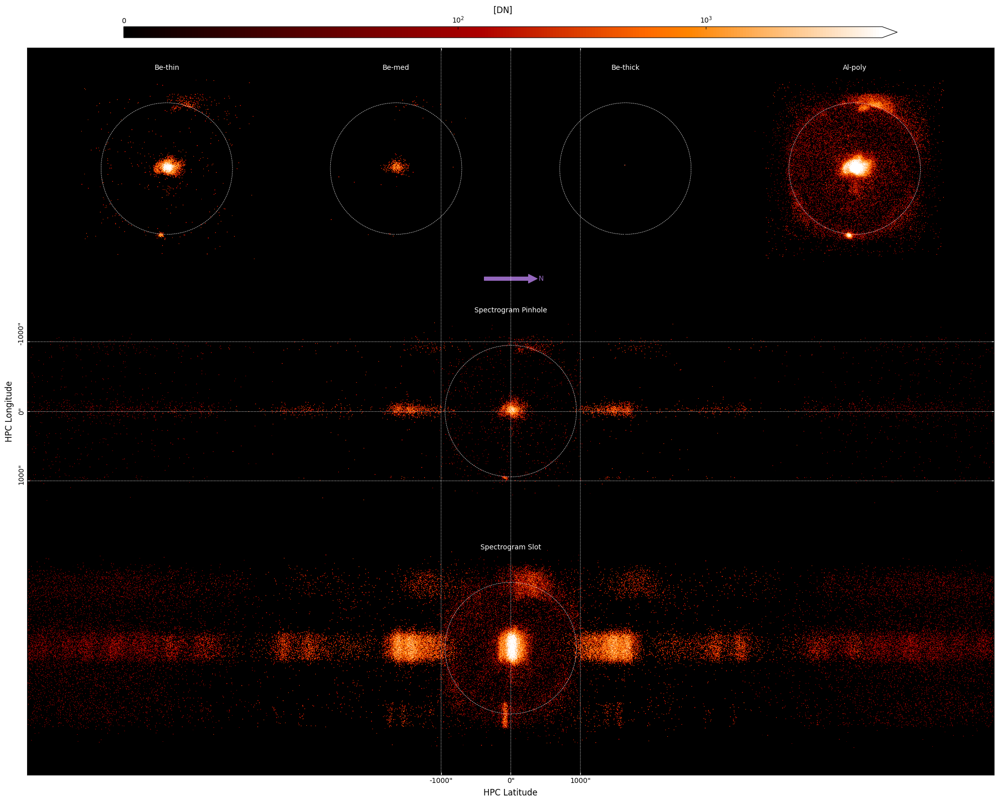

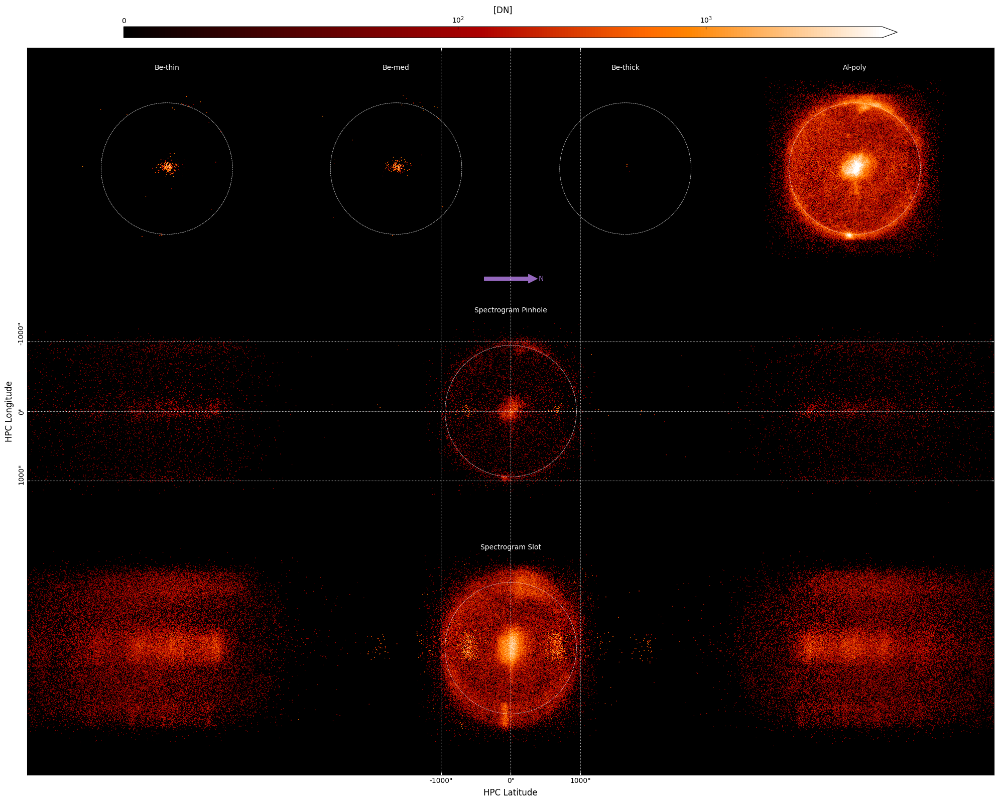

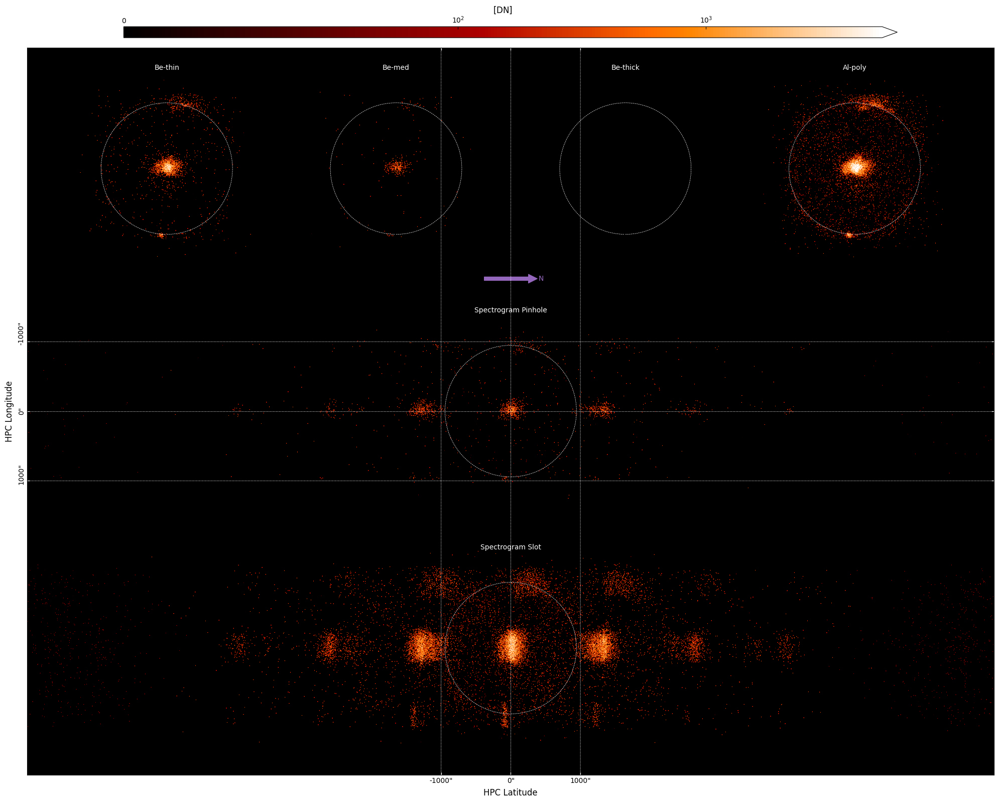

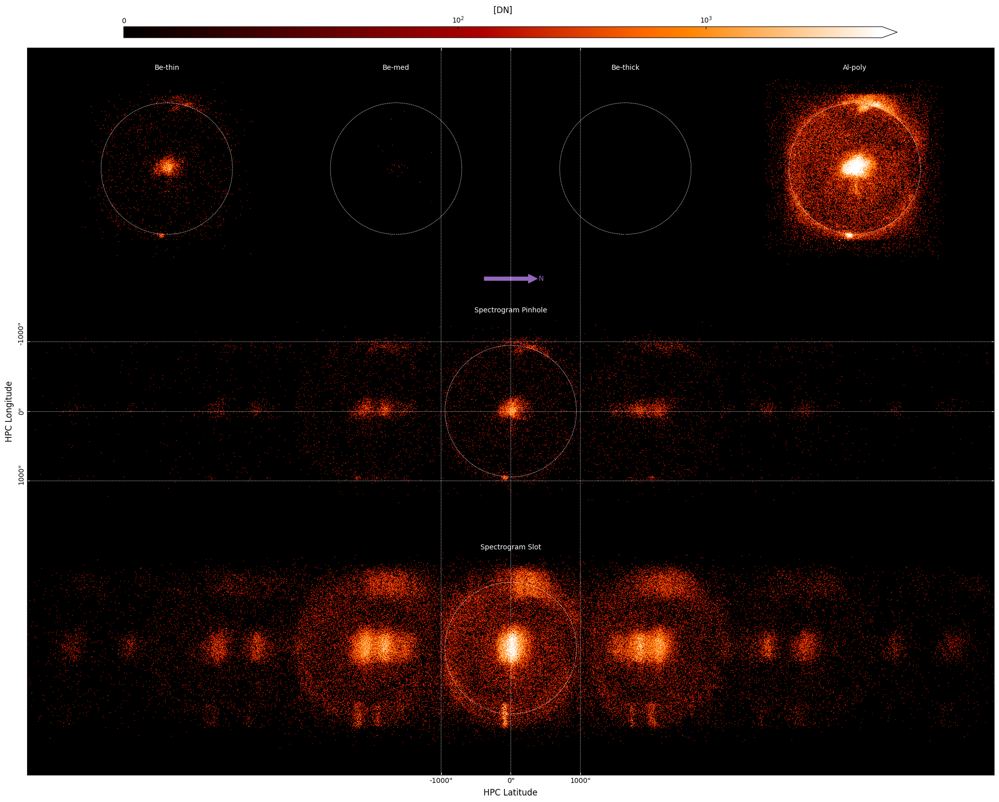

In [18]:
for k in component_collections:
    print(k)
    fig = plot_detector_image(component_collections[k], norm=norm, prime_key='all_components')

In [ ]:
coronal_fe_ne = NDCollection({k: v + component_collections['coronal_ne'][k].data*component_collections['coronal_ne'][k].unit
                              for k,v in component_collections['coronal_fe'].items()})
#photospheric_fe_ne = NDCollection({k: v + component_collections['photospheric_ne'][k].data*component_collections['photospheric_ne'][k].unit
#                              for k,v in component_collections['photospheric_fe'].items()})

In [19]:
orders = range(3)
cutout = np.s_[:,220:320,:]
coronal_fe_slot = get_1d_slot_spectra(component_collections['coronal_fe'], orders=orders, cutout=cutout)
coronal_ne_slot = get_1d_slot_spectra(component_collections['coronal_ne'], orders=orders, cutout=cutout)
coronal_o_slot = get_1d_slot_spectra(component_collections['coronal_o'], orders=orders, cutout=cutout)
coronal_si_slot = get_1d_slot_spectra(component_collections['coronal_si'], orders=orders, cutout=cutout)
coronal_fe_ne_o_si_slot = ndcube.NDCollection({
    k: v + coronal_ne_slot[k].data*coronal_ne_slot[k].unit + coronal_o_slot[k].data*coronal_o_slot[k].unit + coronal_si_slot[k].data*coronal_si_slot[k].unit
    for k,v in coronal_fe_slot.items()
})
photospheric_fe_slot = get_1d_slot_spectra(component_collections['photospheric_fe'], orders=orders, cutout=cutout)
photospheric_ne_slot = get_1d_slot_spectra(component_collections['photospheric_ne'], orders=orders, cutout=cutout)
photospheric_o_slot = get_1d_slot_spectra(component_collections['photospheric_o'], orders=orders, cutout=cutout)
photospheric_si_slot = get_1d_slot_spectra(component_collections['photospheric_si'], orders=orders, cutout=cutout)
photospheric_fe_ne_o_si_slot = ndcube.NDCollection({
    k: v + photospheric_ne_slot[k].data*photospheric_ne_slot[k].unit + photospheric_o_slot[k].data*photospheric_o_slot[k].unit + photospheric_si_slot[k].data*photospheric_si_slot[k].unit
    for k,v in photospheric_fe_slot.items()
})

In [22]:
selected_ar_lines[[0,5,8,11]]

atomic number,ionization stage,transition,transition (latex),ion name,lower level,upper level,max temperature_flare_ext,wavelength,only theoretical_flare_ext,element,ion id,energy,abundance (coronal),abundance (photospheric),intensity (coronal)_flare_ext,intensity_scaled (coronal)_flare_ext,intensity (photospheric)_flare_ext,intensity_scaled (photospheric)_flare_ext,max temperature_active_region,only theoretical_active_region,intensity (coronal)_active_region,intensity_scaled (coronal)_active_region,intensity (photospheric)_active_region,intensity_scaled (photospheric)_active_region
,,,,,,,MK,Angstrom,,,,keV,,,ph / (s sr cm2),,ph / (s sr cm2),,MK,,ph / (s sr cm2),,ph / (s sr cm2),
int16,int16,str48,str93,str9,int16,int16,float32,float64,bool,str2,str5,float64,float64,float64,float64,float64,float64,float64,float32,bool,float64,float64,float64,float64
26,17,2s2.2p6 1S0 - 2s2.2p5.3d 1P1,2s$^{2}$ 2p$^{6}$ $^1$S$_{0}$ - 2s$^{2}$ 2p$^{5}$ 3d $^1$P$_{1}$,Fe XVII,1,27,7.943284034729004,15.012999534606934,False,Fe,fe_17,0.825845615643965,0.0001258925411794166,2.951209226666384e-05,3748177892554219.5,1.0,878658662067070.4,0.9012354747280512,5.01186990737915,False,2225784593858.759,1.0,521774838161.8854,0.5266273912427579
8,7,1s2 1S0 - 1s.2p 1P1,1s$^{2}$ $^1$S$_{0}$ - 1s 2p $^1$P$_{1}$,O VII,1,7,7.079456329345703,21.601499557495117,False,O,o_7,0.573961072022804,0.0007762471166286928,0.0004897788193684457,119535470268644.78,0.031891621394518864,75421782891895.02,0.07735971799276983,2.238720655441284,False,1570289359709.8772,0.7054992491378178,990785604468.0447,1.0
14,12,1s2.2p 2P3/2 - 1s2.3d 2D5/2,1s$^{2}$ 2p $^2$P$_{3/2}$ - 1s$^{2}$ 3d $^2$D$_{5/2}$,Si XII,3,8,10.0,44.160301208496094,True,Si,si_12,0.2807594038995066,0.0001258925411794166,3.235936569296281e-05,377373118436575.25,0.10068175237526199,96999827215970.84,0.09949220226642623,2.238720655441284,True,685693386070.3282,0.30806816974214357,176250338782.7675,0.1778894828386175
10,10,1s 2S1/2 - 2p 2P3/2,1s $^2$S$_{1/2}$ - 2p $^2$P$_{3/2}$,Ne X,1,4,11.220189094543457,12.132100105285645,False,Ne,ne_10,1.0219516601184613,0.00012022644346174131,8.51138038202376e-05,485971340025035.7,0.1296553562706885,344041361502234.2,0.35288137833879707,5.01186990737915,False,85360205215.04002,0.03835061373439298,60430397436.15244,0.0609924055856642


In [47]:
iy_source,ix_source = np.unravel_index(component_collections['coronal_fe']['spectrogram_slot_0'][0,...].data.argmax(),
                                       component_collections['coronal_fe']['spectrogram_slot_0'][0,...].data.shape)
source_location = component_collections['coronal_fe']['spectrogram_slot_0'][0].wcs.array_index_to_world(iy_source,ix_source)

In [48]:
source_location

<SkyCoord (Helioprojective: obstime=2018-07-14T15:00:06.622, rsun=695700.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2018-07-14T15:00:06.622, rsun=695700.0 km): (lon, lat, radius) in (deg, deg, m)
    (0., 4.26852158, 1.52069147e+11)>): (Tx, Ty) in arcsec
    (-62.4744346, 20.82481114)>

In [71]:
coronal_fe_ne = get_line_ratio(coronal_slot_positive,
                               *selected_ar_lines['wavelength'][[0,11]],
                               source_location)
photospheric_fe_ne = get_line_ratio(photospheric_slot_positive,
                                    *selected_ar_lines['wavelength'][[0,11]],
                                    source_location)

2024-10-01 11:11:43 - synthesizAR - WARNING: No observer defined on WCS, SpectralCoord will be converted without any velocity frame change


In [72]:
coronal_fe_ne / photospheric_fe_ne

1.1365627982776745

In [73]:
coronal_si_o = get_line_ratio(coronal_slot_positive,
                              *selected_ar_lines['wavelength'][[8,5]],
                              source_location)
photospheric_si_o = get_line_ratio(photospheric_slot_positive,
                                   *selected_ar_lines['wavelength'][[8,5]],
                                   source_location)

In [74]:
coronal_si_o / photospheric_si_o

1.5719759381264555

2024-10-01 11:12:13 - synthesizAR - WARNING: No observer defined on WCS, SpectralCoord will be converted without any velocity frame change


Text(1800, 130000.0, '$F(Fe)/F(Ne)=$1.14\n$F(Si)/F(O)=$1.57')

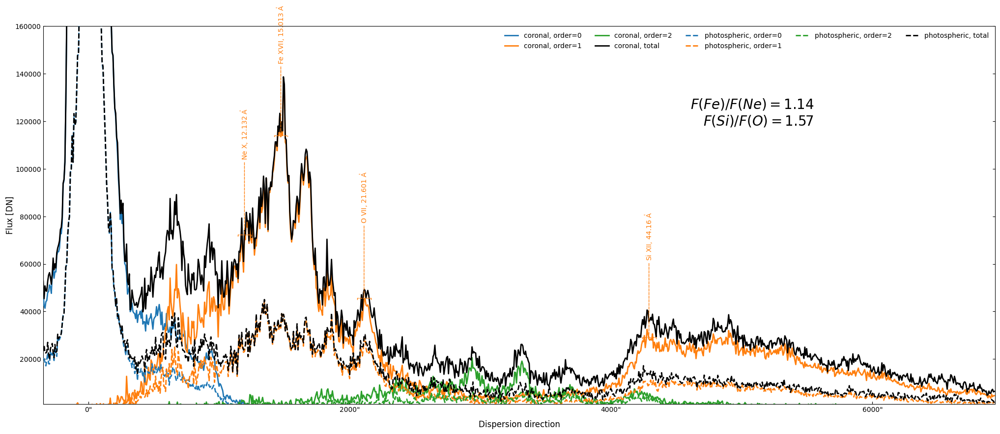

In [75]:
colors={**{f'spectrogram_slot_{i}': f'C{i}' for i in range(5)}, 'all_components': 'k'}
labels={**{f'spectrogram_slot_{i}': f'coronal, order={i}' for i in range(5)}, 'all_components': 'coronal, total'}
fig,ax = plot_labeled_spectrum(
    coronal_slot_positive,#coronal_fe_ne_o_si_slot, 
    figsize=(25,10),
    #y_lim=(1000,2e5),
    #x_lim=(950,2000),
    colors=colors,
    labels=labels,
    line_list=selected_ar_lines[[0,5,8,11]],
    #threshold=DN_threshold,
    source_location=source_location,
    skip_component_labels=['spectrogram_slot_0','spectrogram_slot_2','all_components'],
    ratio_threshold=0.2,
    log_y=False,
)
labels={**{f'spectrogram_slot_{i}': f'photospheric, order={i}' for i in range(5)}, 'all_components': 'photospheric, total'}
fig,ax = plot_labeled_spectrum(
    photospheric_slot_positive,#photospheric_fe_ne_o_si_slot,
    figure=fig,
    axes=ax,
    #figsize=(15,10),
    y_lim=(1000,1.6e5),
    x_lim=(950,2000),
    ls='--',
    colors=colors,
    labels=labels,
    #line_list=selected_ar_lines,
    #threshold=DN_threshold,
    #source_location=source_location,
    #skip_component_labels=['spectrogram_slot_0'],
    #ratio_threshold=0.4,
    log_y=False,
)
ax.text(
    1800,
    1.3e5,
    f'$F(Fe)/F(Ne)=${coronal_fe_ne / photospheric_fe_ne:.02f}\n$F(Si)/F(O)=${coronal_si_o / photospheric_si_o:.02f}',
    va='top',
    ha='right',
    fontsize=20,
)

In [29]:
selected_ar_lines

atomic number,ionization stage,transition,transition (latex),ion name,lower level,upper level,max temperature_flare_ext,wavelength,only theoretical_flare_ext,element,ion id,energy,abundance (coronal),abundance (photospheric),intensity (coronal)_flare_ext,intensity_scaled (coronal)_flare_ext,intensity (photospheric)_flare_ext,intensity_scaled (photospheric)_flare_ext,max temperature_active_region,only theoretical_active_region,intensity (coronal)_active_region,intensity_scaled (coronal)_active_region,intensity (photospheric)_active_region,intensity_scaled (photospheric)_active_region
,,,,,,,MK,Angstrom,,,,keV,,,ph / (s sr cm2),,ph / (s sr cm2),,MK,,ph / (s sr cm2),,ph / (s sr cm2),
int16,int16,str48,str93,str9,int16,int16,float32,float64,bool,str2,str5,float64,float64,float64,float64,float64,float64,float64,float32,bool,float64,float64,float64,float64
26,17,2s2.2p6 1S0 - 2s2.2p5.3d 1P1,2s$^{2}$ 2p$^{6}$ $^1$S$_{0}$ - 2s$^{2}$ 2p$^{5}$ 3d $^1$P$_{1}$,Fe XVII,1,27,7.943284034729004,15.012999534606934,False,Fe,fe_17,0.825845615643965,0.0001258925411794166,2.951209226666384e-05,3748177892554219.5,1.0,878658662067070.4,0.9012354747280512,5.01186990737915,False,2225784593858.759,1.0,521774838161.8854,0.5266273912427579
26,17,2s2.2p6 1S0 - 2s2.2p5.3s 1P1,2s$^{2}$ 2p$^{6}$ $^1$S$_{0}$ - 2s$^{2}$ 2p$^{5}$ 3s $^1$P$_{1}$,Fe XVII,1,3,7.943284034729004,17.051000595092773,False,Fe,fe_17,0.7271373767289793,0.0001258925411794166,2.951209226666384e-05,2995105376327348.5,0.7990830377280506,702121232810619.1,0.7201619808539728,5.01186990737915,False,2134327902406.0183,0.9589103583046258,500335297016.1516,0.5049884604296233
26,18,2s2.2p5 2P3/2 - 2s2.2p4(1D).3d 2D5/2,2s$^{2}$ 2p$^{5}$ $^2$P$_{3/2}$ - 2s$^{2}$ 2p$^{4}$ ($^1$D) 3d $^2$D$_{5/2}$,Fe XVIII,1,56,8.912505149841309,14.203900337219238,False,Fe,fe_18,0.872888400296064,0.0001258925411794166,2.951209226666384e-05,1835116443907553.5,0.4896022804982188,430193284727551.4,0.44124694369274864,6.309576034545898,False,208962231324.89133,0.0938825041297556,48985528398.53577,0.04944109823319064
26,18,2s2.2p5 2P3/2 - 2s2.2p4(3P).3s 4P5/2,2s$^{2}$ 2p$^{5}$ $^2$P$_{3/2}$ - 2s$^{2}$ 2p$^{4}$ ($^3$P) 3s $^4$P$_{5/2}$,Fe XVIII,1,4,8.912505149841309,16.07200050354004,False,Fe,fe_18,0.7714297819110404,0.0001258925411794166,2.951209226666384e-05,1255486084382404.0,0.33495904420023276,294314665624241.1,0.30187697321425094,6.309576034545898,False,201585572879.32556,0.09056832068814182,47256270869.64894,0.047695758453233636
8,8,1s 2S1/2 - 2p 2P3/2,1s $^2$S$_{1/2}$ - 2p $^2$P$_{3/2}$,O VIII,1,4,11.220189094543457,18.967100143432617,False,O,o_8,0.6536803069294171,0.0007762471166286928,0.0004897788193684457,1545190098544784.8,0.4122510037782132,974949041294903.1,1.0,2.8183817863464355,False,1367396974302.184,0.6143438040118606,862769163755.955,0.8707929948368375
8,7,1s2 1S0 - 1s.2p 1P1,1s$^{2}$ $^1$S$_{0}$ - 1s 2p $^1$P$_{1}$,O VII,1,7,7.079456329345703,21.601499557495117,False,O,o_7,0.573961072022804,0.0007762471166286928,0.0004897788193684457,119535470268644.78,0.031891621394518864,75421782891895.02,0.07735971799276983,2.238720655441284,False,1570289359709.8772,0.7054992491378178,990785604468.0447,1.0
8,7,1s2 1S0 - 1s.2p 3P1,1s$^{2}$ $^1$S$_{0}$ - 1s 2p $^3$P$_{1}$,O VII,1,4,2.8183817863464355,21.803600311279297,False,O,o_7,0.5686409430696706,0.0007762471166286928,0.0004897788193684457,14228124883848.127,0.003796011099716583,8977339893645.35,0.009208009355772965,1.9952632188796997,False,275240968010.3163,0.12366019998958722,173665310267.94656,0.17528041332533079
8,7,1s2 1S0 - 1s.2s 3S1,1s$^{2}$ $^1$S$_{0}$ - 1s 2s $^3$S$_{1}$,O VII,1,2,2.8183817863464355,22.097700119018555,False,O,o_7,0.5610728617250639,0.0007762471166286928,0.0004897788193684457,60396034780597.14,0.016113438719270574,38107321722298.87,0.03908647540356126,1.9952632188796997,False,1136431692830.5374,0.5105757744779554,717039923091.4847,0.7237084590833002
